# Problem Statement and Goal

The customer data is given as the dataset. There are multiple factors which affect the customer spending, loyalty and purchases for the business. It contains information about customers, their purchases, products, and transaction details. The data includes various attributes such as customer ID, name, email, phone, address, city, state, zipcode, country, age, gender, income, customer segment, last purchase date, total purchases, amount spent, product category, product brand, product type, feedback, shipping method, payment method, and order status. By analyzing these factors, a business can take steps to increase profits, improve customer service and avoid customer churn.

The goal of this notebook is to do an analysis of the given data and then segment the customers using RFM approach.

# Approach

1. Import necessary libraries
2. Get data
3. Explore and analyze data using visualization techniques
4. Prepare data for segmentation
5. Clustering model for customer segmentation
6. Final Segmentation
7. Conclusion

# Import Libraries

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

# Get Data

In [7]:
df = pd.read_csv('/kaggle/input/retail-analysis-large-dataset/new_retail_data.csv')

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 302010 entries, 0 to 302009
Data columns (total 30 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Transaction_ID    301677 non-null  float64
 1   Customer_ID       301702 non-null  float64
 2   Name              301628 non-null  object 
 3   Email             301663 non-null  object 
 4   Phone             301648 non-null  float64
 5   Address           301695 non-null  object 
 6   City              301762 non-null  object 
 7   State             301729 non-null  object 
 8   Zipcode           301670 non-null  float64
 9   Country           301739 non-null  object 
 10  Age               301837 non-null  float64
 11  Gender            301693 non-null  object 
 12  Income            301720 non-null  object 
 13  Customer_Segment  301795 non-null  object 
 14  Date              301651 non-null  object 
 15  Year              301660 non-null  float64
 16  Month             30

- There are total 302010 records with 30 columns
- There are missing values


In [9]:
#Calculating missing value percentage

df.isnull().sum()/len(df)*100

Transaction_ID      0.110261
Customer_ID         0.101983
Name                0.126486
Email               0.114897
Phone               0.119864
Address             0.104301
City                0.082116
State               0.093043
Zipcode             0.112579
Country             0.089732
Age                 0.057283
Gender              0.104963
Income              0.096023
Customer_Segment    0.071190
Date                0.118870
Year                0.115890
Month               0.090394
Time                0.115890
Total_Purchases     0.119532
Amount              0.118208
Total_Amount        0.115890
Product_Category    0.093706
Product_Brand       0.093043
Product_Type        0.000000
Feedback            0.060925
Shipping_Method     0.111586
Payment_Method      0.098341
Order_Status        0.077812
Ratings             0.060925
products            0.000000
dtype: float64

Since the missing value percentage is not even 1% for any column, we can simply drop records with missing values

In [10]:
#Checking for duplicate records
df.duplicated().sum()

4

In [11]:
#Dropping duplicate records and records with null values

df.drop_duplicates(inplace=True)
df.dropna(inplace=True)

# Exploratory Data Analysis

In [13]:
# Values in each column
for col in df.columns:
    print(f"Total unique values in {col} : {df[col].nunique()}")
    if df[col].nunique() > 20:
        print(f"Unique values are {list(df[col].unique())[0:5]}...and so on")
        print('-'*100)
        
    else:
        print(f"Unique values are {df[col].unique()}")
        print('-'*100)
    

Total unique values in Transaction_ID : 287005
Unique values are [8691788.0, 2174773.0, 6679610.0, 7232460.0, 4983775.0]...and so on
----------------------------------------------------------------------------------------------------
Total unique values in Customer_ID : 86485
Unique values are [37249.0, 69749.0, 30192.0, 62101.0, 27901.0]...and so on
----------------------------------------------------------------------------------------------------
Total unique values in Name : 156638
Unique values are ['Michelle Harrington', 'Kelsey Hill', 'Scott Jensen', 'Joseph Miller', 'Debra Coleman']...and so on
----------------------------------------------------------------------------------------------------
Total unique values in Email : 52530
Unique values are ['Ebony39@gmail.com', 'Mark36@gmail.com', 'Shane85@gmail.com', 'Mary34@gmail.com', 'Charles30@gmail.com']...and so on
----------------------------------------------------------------------------------------------------
Total unique va

There are some columns that are clearly not necessary for analysis or processing such as identity related columns such as name, email,phone no etc 



In [14]:
#Creating a fresh dataset for data visualization
df1 = df[['Transaction_ID', 'Customer_ID', 'Country', 'Age', 'Gender', 'Income',
       'Customer_Segment', 'Date', 'Year', 'Month', 'Time', 'Total_Purchases',
       'Amount', 'Total_Amount', 'Product_Category', 'Product_Brand',
       'Product_Type', 'Feedback', 'Shipping_Method', 'Payment_Method',
       'Order_Status', 'Ratings', 'products']]

In [15]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
Transaction_ID,293908.0,5.493739e+06,2.596095e+06,1.000007e+06,3.245886e+06,5.495915e+06,7.738210e+06,9.999995e+06
Customer_ID,293908.0,5.501364e+04,2.600943e+04,1.000000e+04,3.247000e+04,5.502700e+04,7.751400e+04,9.999900e+04
Age,293908.0,3.546553e+01,1.501764e+01,1.800000e+01,2.200000e+01,3.200000e+01,4.600000e+01,7.000000e+01
Year,293908.0,2.023165e+03,3.712953e-01,2.023000e+03,2.023000e+03,2.023000e+03,2.023000e+03,2.024000e+03
Total_Purchases,293908.0,5.359837e+00,2.868441e+00,1.000000e+00,3.000000e+00,5.000000e+00,8.000000e+00,1.000000e+01
Amount,293908.0,2.551539e+02,1.413891e+02,1.000022e+01,1.328376e+02,2.554645e+02,3.776394e+02,4.999979e+02
Total_Amount,293908.0,1.367684e+03,1.128899e+03,1.000375e+01,4.388441e+02,1.041164e+03,2.028952e+03,4.999626e+03
Ratings,293908.0,3.162320e+00,1.320755e+00,1.000000e+00,2.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


In [16]:
fig = px.pie(df1, names = 'Country', title='Distribution of transactions country-wise')
fig.show()

In [17]:
fig = px.pie(df1, names = 'Gender', title='Distribution of transactions gender-wise')
fig.show()

In [18]:
fig = px.pie(df1, names = 'Income', title='Distribution of transactions Income-wise')
fig.show()

#### Inference-1
- More transactions or purchases are happening from US
- It can be seen that males are doing more transactions than females
- It is also evident that more transactions are happening from customers to belong to Medium income category.



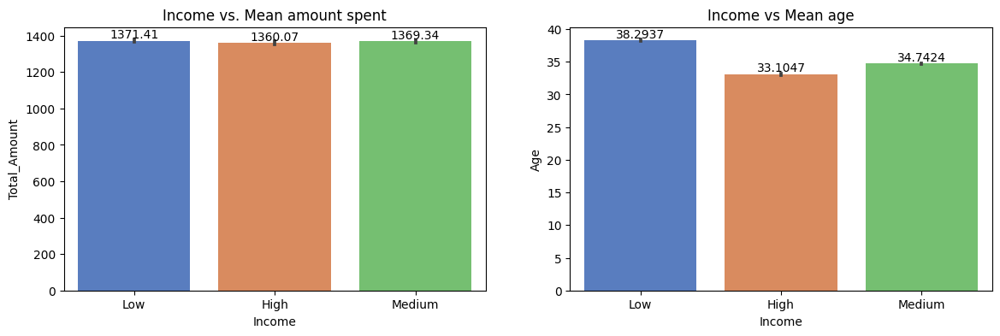

In [19]:
f,axes = plt.subplots(1,2,figsize=(14,4))
ax = sns.barplot(x = df1['Income'], y=df1['Total_Amount'],palette= 'muted', ax=axes[0])
ax.set_title("Income vs. Mean amount spent")
for i in ax.containers:
    ax.bar_label(i)
ax = sns.barplot(x = df1['Income'], y=df1['Age'],palette='muted',ax=axes[1])
ax.set_title("Income vs Mean age")
for i in ax.containers:
    ax.bar_label(i)


#### Inference-2
- The mean amount spent on purchases is lowest for high income customers whereas it is highest for low income customers
- The mean age is lowest for High income group whereas it is highest for low income customers.

We must note that in the first case, the difference in means for all three categories is marginal.

Text(0.5, 1.0, 'Distribution of age')

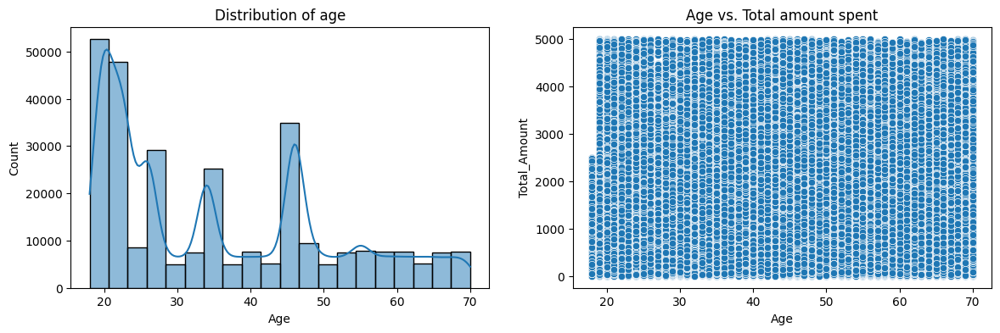

In [20]:
f,axes = plt.subplots(1,2,figsize=(14,4))
ax = sns.scatterplot(x = df1['Age'], y=df1['Total_Amount'],ax=axes[1])
ax.set_title("Age vs. Total amount spent")
ax = sns.histplot(x = df1['Age'], bins=20, kde=True,ax=axes[0])
ax.set_title("Distribution of age")



Text(0.5, 1.0, 'Payment method used vs Age')

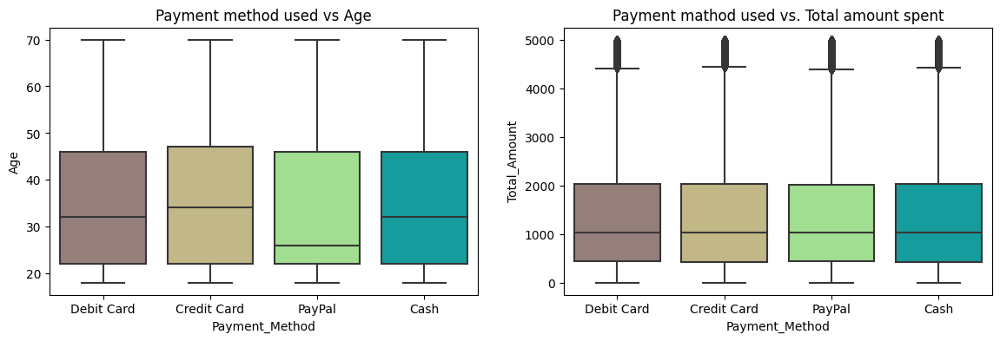

In [8]:
f,axes = plt.subplots(1,2,figsize=(14,4))
ax = sns.boxplot(x = df1['Payment_Method'], y=df1['Total_Amount'],palette = 'terrain_r', ax=axes[1])
ax.set_title("Payment mathod used vs. Total amount spent")
ax = sns.boxplot(x = df1['Payment_Method'], y=df1['Age'],palette = 'terrain_r',ax=axes[0])
ax.set_title("Payment method used vs Age")

#### Inference-3
- More customers are below the age of 30.
- There appears to be no correlation between age and amount being spent.
- The mean age is least for customers using PayPal for payment and highest for customers using credit card
- There mean amount being spent on all payment methods are similar.

In [33]:
fig = px.pie(df1, names = 'Product_Category', title='Distribution of transactions product category-wise')
fig.show()

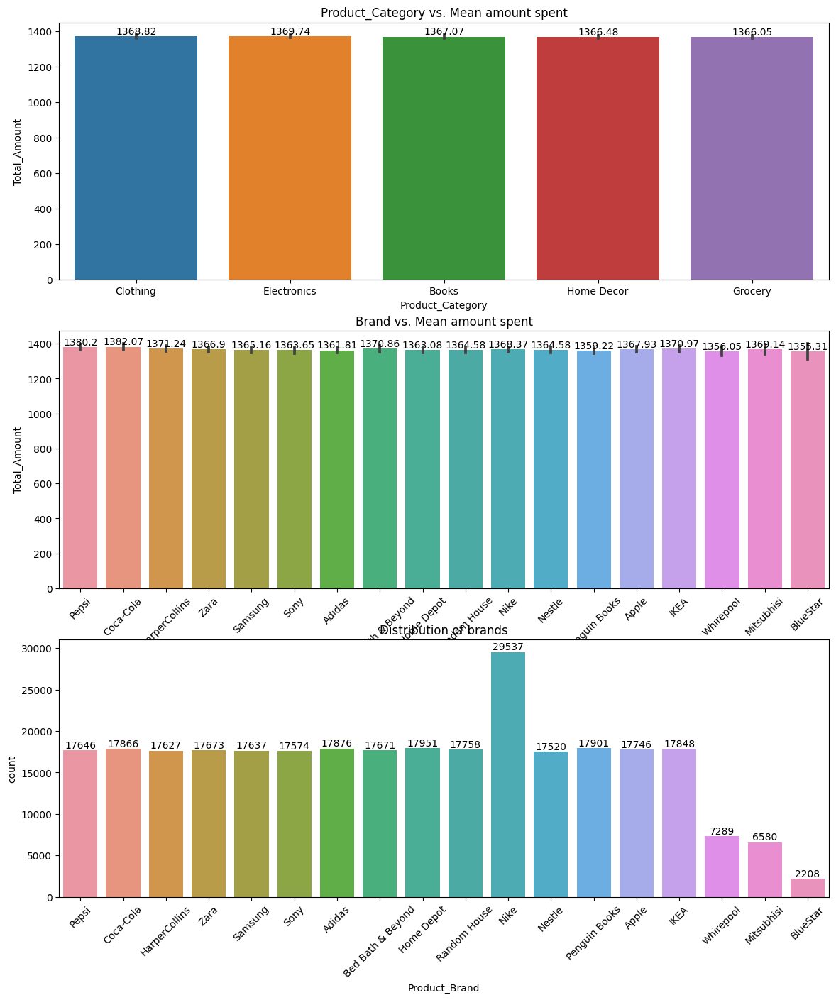

In [14]:
f,axes = plt.subplots(3,1,figsize=(14,16))
ax = sns.barplot(x = df1['Product_Category'], y=df1['Total_Amount'],ax=axes[0])
ax.set_title("Product_Category vs. Mean amount spent")
for i in ax.containers:
    ax.bar_label(i)
ax = sns.barplot(x = df1['Product_Brand'], y=df1['Total_Amount'],ax=axes[1])
ax.set_title("Brand vs. Mean amount spent")
ax.set_xticklabels(labels = list(dict(df1['Product_Brand'].value_counts()).keys()), rotation=45)
for i in ax.containers:
    ax.bar_label(i)
ax = sns.countplot(x = df1['Product_Brand'],ax=axes[2])
ax.set_title("Distribution of brands")
ax.set_xticklabels(labels = list(dict(df1['Product_Brand'].value_counts()).keys()), rotation=45)
for i in ax.containers:
    ax.bar_label(i)

#### Inference-4
- Electronics are the most popular product category
- THe mean amount spent on all product categories or brands are the similar.
- But the number of orders for Nike is maximum and BlueStar is minimum. 

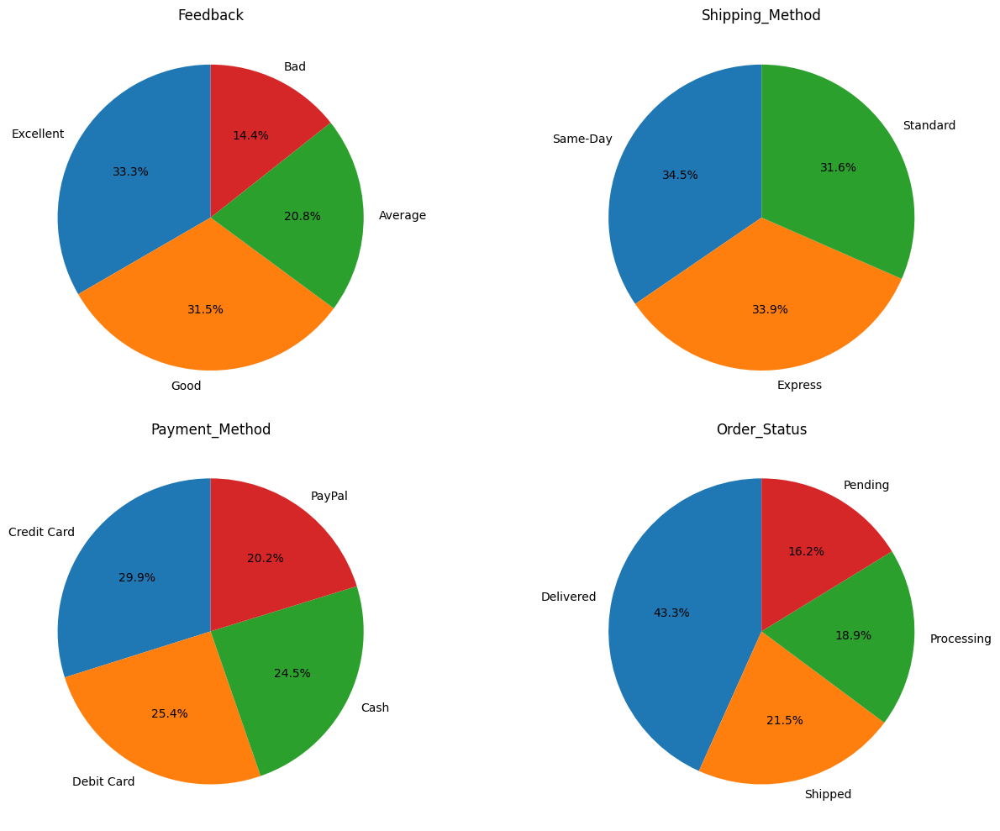

In [11]:
#Checking distribution of few more categorical variables
data = df1[['Feedback', 'Shipping_Method', 'Payment_Method',
       'Order_Status']]

# Get unique feature names
features = data.columns

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Flatten the axs array for easier indexing
axs = axs.flatten()

# Plot pie charts for each feature
for i, feature in enumerate(features):
    # Count occurrences of True and False
    counts = data[feature].value_counts()
    labels = counts.index
    sizes = counts.values

    # Plot pie chart
    axs[i].pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
    axs[i].set_title(feature)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

#### Inference-5

- The feedback is mostly good or excellent. THere is only 14% of bad feedback.
- All three shipping methods are equally popular
- Credit and debit cards are more frequently used for making payments.
- More orders have been delivered. Around 16% of the orders are in pending status.

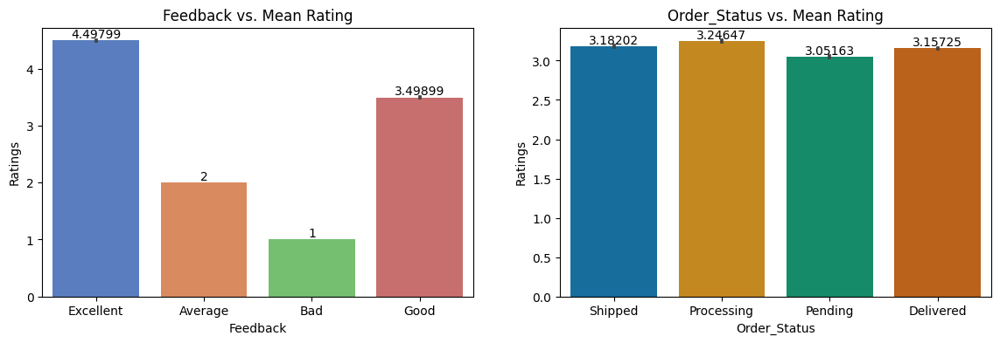

In [51]:
f,axes = plt.subplots(1,2,figsize=(14,4))
ax = sns.barplot(x = df1['Feedback'], y=df1['Ratings'],palette='muted',ax=axes[0])
ax.set_title("Feedback vs. Mean Rating")
for i in ax.containers:
    ax.bar_label(i)
ax = sns.barplot(x = df1['Order_Status'], y=df1['Ratings'],palette = 'colorblind',ax=axes[1])
ax.set_title("Order_Status vs. Mean Rating")
for i in ax.containers:
    ax.bar_label(i)

#### Inference-6
- Feedback column is redundant as it reflects the ratings given
- Pending orders have least mean rating as expected.

Text(0.5, 1.0, 'Customer segment vs. Age')

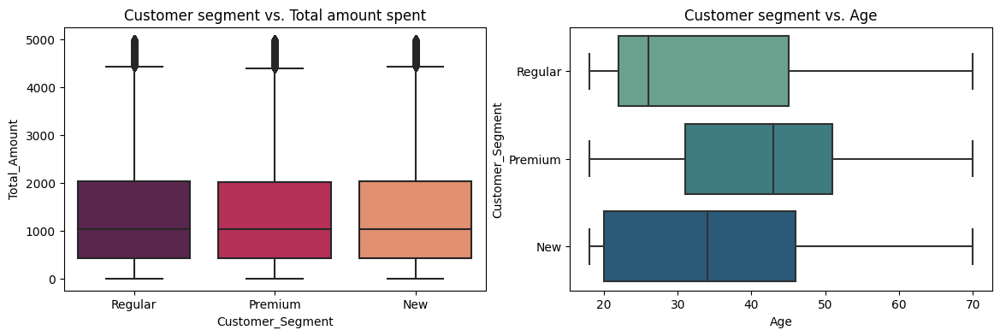

In [43]:
f,axes = plt.subplots(1,2,figsize=(14,4))
ax = sns.boxplot(x = df1['Customer_Segment'], y=df1['Total_Amount'],palette = 'rocket', ax=axes[0])
ax.set_title("Customer segment vs. Total amount spent")
ax = sns.boxplot(y = df1['Customer_Segment'], x=df1['Age'],palette = 'crest', orient='h',ax=axes[1])
ax.set_title("Customer segment vs. Age")


#### Inference-7
- All customer segments are have similar mean spending
- It can be seen that Premium segment has the highest mean age whereas the Regular segment has the lowest mean age


In [21]:
df1['Date'] = pd.to_datetime(df1['Date'])
df1['Day'] = df1['Date'].dt.day
df1['Day_name'] = df1['Date'].dt.day_name()

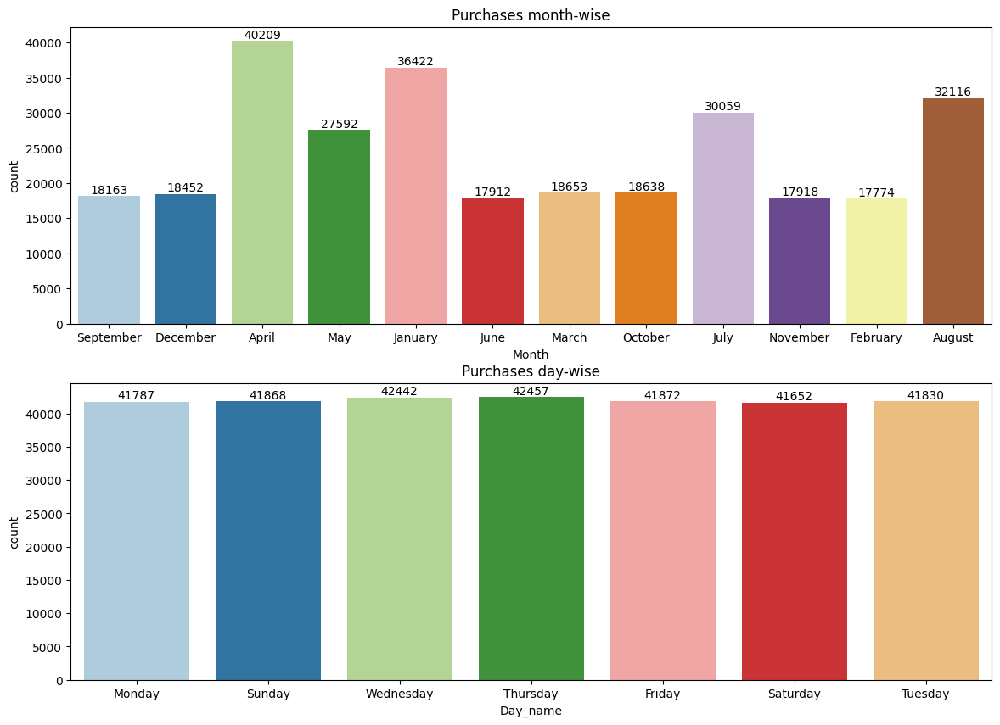

In [53]:
f,axes = plt.subplots(2,1,figsize=(14,10))
ax = sns.countplot(x = df1['Month'],palette='Paired', ax=axes[0])
ax.set_title("Purchases month-wise")
for i in ax.containers:
    ax.bar_label(i)
ax = sns.countplot(x = df1['Day_name'],palette='Paired',ax=axes[1])
ax.set_title("Purchases day-wise")
for i in ax.containers:
    ax.bar_label(i)

#### Inference-8
- The month of April has highest number of transactions followed by August
- All days of the week have similar number of transactions with Thursday being slightly higher than the rest.

In [22]:
df1['Month_Year'] = df1['Date'].dt.to_period('M')

Text(0.5, 1.0, 'Total amount spent on each product category')

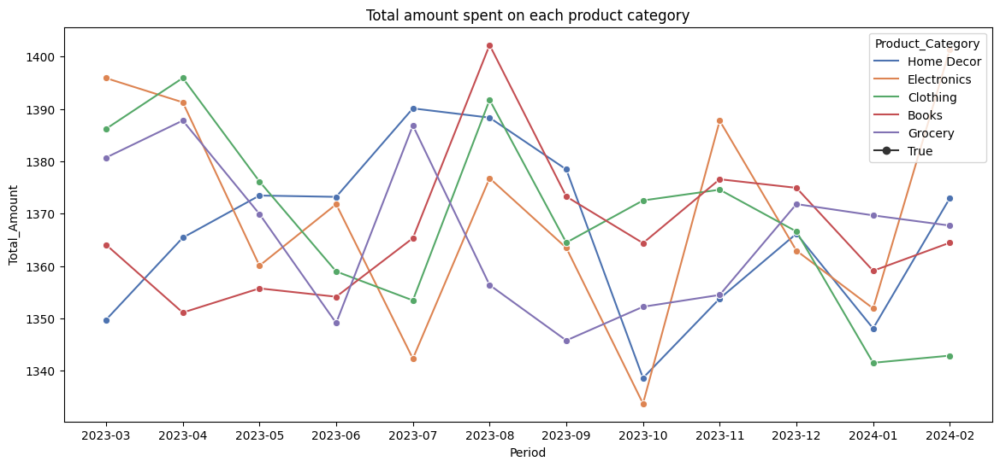

In [38]:
df1['Period'] = df1['Month_Year'].astype(str)
df_sorted = df1.sort_values('Period')
plt.figure(figsize=(14,6))
sns.lineplot(x = df_sorted['Period'], y = df_sorted['Total_Amount'], hue=df_sorted['Product_Category'],err_style=None, style=True, markers=True, palette='deep').set_title("Total amount spent on each product category")

## Inferences Consolidated

-  More transaction are happening from the US. Males are more in number than females. More transactions are being done by the Medium income customers.

- More customers are below the age of 30. The mean age is low for high income customers and it is high for low income customers.

-  There appears to be no correlation between age and amount being spent.  The mean age is least for customers using PayPal for payment and highest for customers using credit card.

- Electronics are the most popular product category. The mean amount spent on all product categories or brands are the similar. But the number of orders for Nike is maximum and BlueStar is minimum. 

- There is only 14% of bad feedback.

-  Credit and debit cards are more frequently used for making payments. The mean amount spent on all payment methods are similar. 

- All three shipping methods are equally popular. More orders have been delivered. Around 16% of the orders are in pending status. Pending orders have least mean rating as expected.

- The month of April has highest number of transactions followed by August. All days of the week have similar number of transactions with Thursday being slightly higher than the rest. We cannot pinpoint to any seasonal pattern in shopping based on the visuals.

- All customer segments are have similar mean spending. It can be seen that Premium segment has the highest mean age whereas the Regular segment has the lowest mean age. 

#### It is clear that customer segment given in the data does not have a relationship with the spending pattern of the customer. Therefore, we will build our on customer segmentation based on spending, frequency of purchases and recency of purchase. 



# Data Pre-processing

In [23]:
#Drop redundant columns and create fresh dataset
df2 = df1[['Transaction_ID', 'Customer_ID', 'Country', 'Age', 'Gender', 'Income',
       'Customer_Segment', 'Date', 'Total_Amount', 'Product_Category', 'Product_Brand','Product_Type','products',
       'Shipping_Method', 'Payment_Method',
       'Order_Status', 'Ratings']]

In [41]:
#Encoding income column for better processing
df2['Income'] = df2['Income'].map({'Low':1, 'Medium':2, 'High':3})

<Axes: >

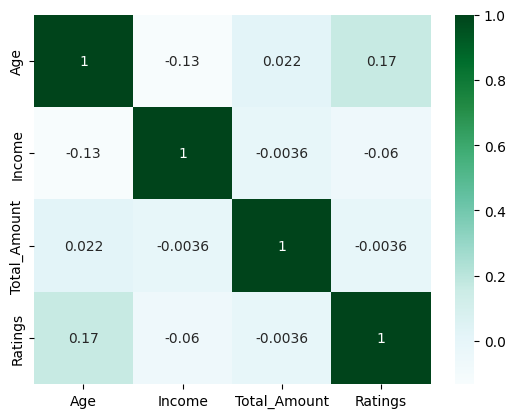

In [44]:
#Finding correlations
corr = df2[['Age', 'Income','Total_Amount','Ratings']]
sns.heatmap(corr.corr(), annot=True, cmap='BuGn')

In [47]:
df2.head()

,Transaction_ID,Customer_ID,Country,Age,Gender,Income,Customer_Segment,Date,Total_Amount,Product_Category,Product_Brand,Product_Type,products,Shipping_Method,Payment_Method,Order_Status,Ratings
0,8691788.0,37249.0,Germany,21.0,Male,1,Regular,2023-09-18,324.086270,Clothing,Nike,Shorts,Cycling shorts,Same-Day,Debit Card,Shipped,5.0
1,2174773.0,69749.0,UK,19.0,Female,1,Premium,2023-12-31,806.707815,Electronics,Samsung,Tablet,Lenovo Tab,Standard,Credit Card,Processing,4.0
2,6679610.0,30192.0,Australia,48.0,Male,1,Regular,2023-04-26,1063.432799,Books,Penguin Books,Children's,Sports equipment,Same-Day,Credit Card,Processing,2.0
3,7232460.0,62101.0,Canada,56.0,Male,3,Premium,2023-05-08,2466.854021,Home Decor,Home Depot,Tools,Utility knife,Standard,PayPal,Processing,4.0
4,4983775.0,27901.0,UK,22.0,Male,1,Premium,2024-01-10,248.553049,Grocery,Nestle,Chocolate,Chocolate cookies,Standard,Cash,Shipped,1.0


# Customer Segmentation using RFM approach

#### RFM : Recency-Frequency-Monetary

These are the 3 main attributes by which we can segment our customers for better advertising as well as customer service. 

- Recency: How recently the customer has made purchases. A customer who is more recent has better value for the business and their feedback has higher impact.
- Frequency : How frequently a particular customer has made purchases. Naturally, these are loyal customers and new discounts or offers can be given to such customers.
- Monetary: How much money is a customer spending on his purchases. The higher the spending, the more valuable the customer is. 

Thus, the business should look for customers that have a higher Frequency and Monetary value and lower Recency. 


In [24]:
rfm = df2[['Customer_ID', 'Total_Amount','Date','Transaction_ID']]

In [25]:
# Monetary
rfm_m = rfm.groupby('Customer_ID')['Total_Amount'].sum()
rfm_m = rfm_m.reset_index()
rfm_m.columns = ['Customer_ID', 'Monetary']
rfm_m.head()

,Customer_ID,Monetary
0,10000.0,5007.566357
1,10001.0,8136.462824
2,10002.0,4104.013951
3,10003.0,2340.496447
4,10004.0,2356.516683


In [26]:
#Frequency

rfm_f = rfm.groupby('Customer_ID')['Transaction_ID'].count()
rfm_f = rfm_f.reset_index()
rfm_f.columns = ['Customer_ID', 'Frequency']
rfm_f.head()

,Customer_ID,Frequency
0,10000.0,4
1,10001.0,5
2,10002.0,5
3,10003.0,2
4,10004.0,2


In [27]:
#Recency

rfm['Days_diff'] = max(rfm['Date']) - rfm['Date']
rfm_r = rfm.groupby('Customer_ID')['Days_diff'].min()
rfm_r = rfm_r.reset_index()
rfm_r.columns = ['Customer_ID', 'Recency']
rfm_r['Recency'] = rfm_r['Recency'].dt.days
rfm_r.head()

,Customer_ID,Recency
0,10000.0,102
1,10001.0,104
2,10002.0,94
3,10003.0,227
4,10004.0,30


In [28]:
#Combining all columns into a single dataframe
rfm_final = rfm[['Customer_ID']]
rfm_final = pd.merge(rfm_final, rfm_r, on='Customer_ID', how='inner')
rfm_final = pd.merge(rfm_final, rfm_f, on='Customer_ID', how='inner')
rfm_final = pd.merge(rfm_final, rfm_m, on='Customer_ID', how='inner')
rfm_final.head()

,Customer_ID,Recency,Frequency,Monetary
0,37249.0,23,5,6485.389528
1,69749.0,0,5,4089.881243
2,30192.0,127,4,7337.481177
3,62101.0,50,3,7936.809742
4,27901.0,27,3,1334.931576


Text(0.5, 0, 'Attributes')

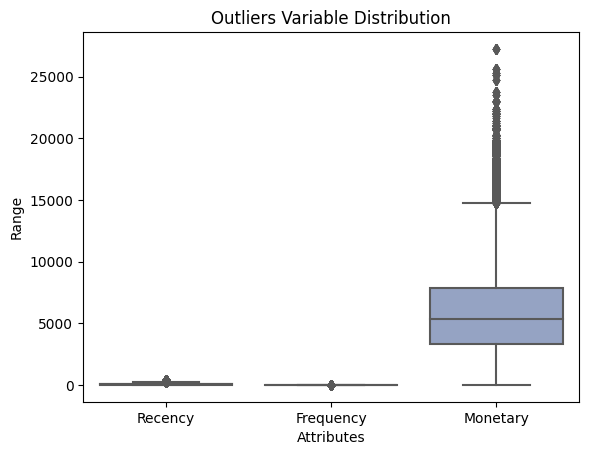

In [29]:
attributes = ['Recency','Frequency','Monetary']
sns.boxplot(data = rfm_final[attributes], orient="v", palette="Set2")
plt.title("Outliers Variable Distribution")
plt.ylabel("Range")
plt.xlabel("Attributes")

In [30]:
# Removing outliers for Monetary
Q1 = rfm_final.Monetary.quantile(0.05)
Q3 = rfm_final.Monetary.quantile(0.95)
IQR = Q3 - Q1
rfm_final = rfm_final[(rfm_final.Monetary >= Q1 - 1.5*IQR) & (rfm_final.Monetary <= Q3 + 1.5*IQR)]

# Removing outliers for Recency
Q1 = rfm_final.Recency.quantile(0.05)
Q3 = rfm_final.Recency.quantile(0.95)
IQR = Q3 - Q1
rfm_final = rfm_final[(rfm_final.Recency >= Q1 - 1.5*IQR) & (rfm_final.Recency <= Q3 + 1.5*IQR)]

# Removing outliers for Frequency
Q1 = rfm_final.Frequency.quantile(0.05)
Q3 = rfm_final.Frequency.quantile(0.95)
IQR = Q3 - Q1
rfm_final = rfm_final[(rfm_final.Frequency >= Q1 - 1.5*IQR) & (rfm_final.Frequency <= Q3 + 1.5*IQR)]

In [31]:
# Standardization

rfm_df = rfm_final[['Monetary', 'Frequency', 'Recency']]

# Instantiate
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# fit_transform
rfm_df_scaled = scaler.fit_transform(rfm_df)
rfm_df_scaled.shape

(293908, 3)

In [32]:
rfm_df_scaled = pd.DataFrame(rfm_df_scaled)
rfm_df_scaled.columns = ['Monetary', 'Frequency', 'Recency']
rfm_df_scaled.head()

,Monetary,Frequency,Recency
0,0.184915,0.392311,-0.781287
1,-0.514257,0.392311,-1.103157
2,0.433613,-0.155329,0.674128
3,0.608538,-0.702968,-0.403439
4,-1.318338,-0.702968,-0.725309


## K-means Clustering 



In [33]:
import sklearn
from sklearn.cluster import KMeans

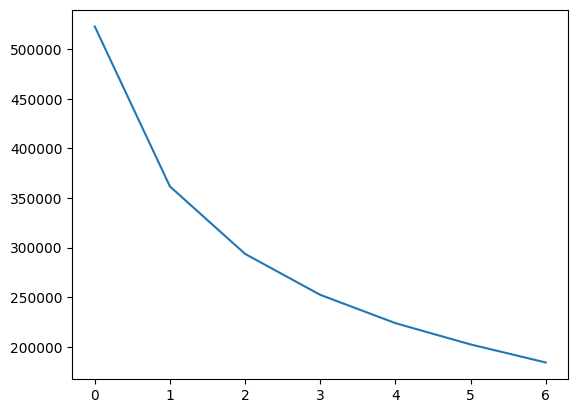

In [34]:
#Plotting elbow curve for optimum number of clusters
wcss = []
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]
for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(rfm_df_scaled)
    
    wcss.append(kmeans.inertia_)    

plt.plot(wcss)

It appears that at k=3, there is a bend.

In [35]:
from sklearn.metrics import davies_bouldin_score
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(rfm_df_scaled)
    
    cluster_labels = kmeans.labels_
    
    # silhouette score
    db_avg = davies_bouldin_score(rfm_df_scaled, cluster_labels)
    print(f"For n_clusters={num_clusters}, the Davies-Bouldin score is {db_avg}")
    

For n_clusters=2, the Davies-Bouldin score is 1.0709369541207403
For n_clusters=3, the Davies-Bouldin score is 0.970615960288801
For n_clusters=4, the Davies-Bouldin score is 1.0608667693437936
For n_clusters=5, the Davies-Bouldin score is 1.0324909990035889
For n_clusters=6, the Davies-Bouldin score is 1.0770744200040017
For n_clusters=7, the Davies-Bouldin score is 1.0740090310823933
For n_clusters=8, the Davies-Bouldin score is 1.0697245947817162


Lowest value of Davies-Bouldin score is the best clustering model

In [36]:
# Final model with k=3
kmeans = KMeans(n_clusters=3, max_iter=50)
kmeans.fit(rfm_df_scaled)

KMeans(max_iter=50, n_clusters=3)

In [37]:
 kmeans.labels_

array([2, 2, 2, ..., 2, 0, 2], dtype=int32)

In [38]:
#Calculating Metrics

from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
db_index = davies_bouldin_score(rfm_df_scaled, kmeans.labels_)
ch_index = calinski_harabasz_score(rfm_df_scaled, kmeans.labels_)

print(f'Davies-Bouldin Score : {db_index}')
print(f'Calinski-Harabasz Score : {ch_index}')


Davies-Bouldin Score : 0.9694968848422455
Calinski-Harabasz Score : 211299.62426044155


In [39]:
# assign the label
rfm_final['Cluster_Id'] = kmeans.labels_
rfm_final.head()

,Customer_ID,Recency,Frequency,Monetary,Cluster_Id
0,37249.0,23,5,6485.389528,2
1,69749.0,0,5,4089.881243,2
2,30192.0,127,4,7337.481177,2
3,62101.0,50,3,7936.809742,2
4,27901.0,27,3,1334.931576,2


<Axes: xlabel='Cluster_Id', ylabel='Frequency'>

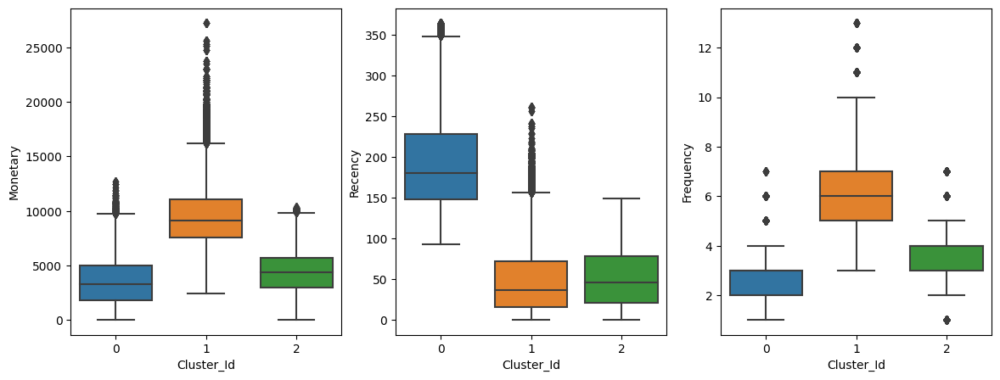

In [40]:
# Box plot to visualize Cluster Ids
f,axes = plt.subplots(1,3,figsize=(14,5))

sns.boxplot(x='Cluster_Id', y='Monetary', data=rfm_final, ax=axes[0])
sns.boxplot(x='Cluster_Id', y='Recency', data=rfm_final, ax=axes[1])
sns.boxplot(x='Cluster_Id', y='Frequency', data=rfm_final, ax=axes[2])

# Final Customer Segmentation
Top-priority customers have maximum mean Monetary and Frequency value and least mean Recency value. Customers with least mean Monetary and Frequency values and maximum mean Recency value are Last priority customers.

- #### Cluster_Id-1 : Gold/Top-tier customers
- #### Cluster_Id-2 : Silver/Middle-tier customers
- #### Cluster_Id-0 : Bronze/Last-tier customers

With the above result, the business can give discounts or offers to the Gold customers. They can direct their advertising campaigns based on the above segmentation so that they can retain their top-tier customers and also manage to promote Silver customers to Gold.




### Comparing given Customer Segment with Final Segmentation done by Clustering

In [41]:
rfm_final.head()

,Customer_ID,Recency,Frequency,Monetary,Cluster_Id
0,37249.0,23,5,6485.389528,2
1,69749.0,0,5,4089.881243,2
2,30192.0,127,4,7337.481177,2
3,62101.0,50,3,7936.809742,2
4,27901.0,27,3,1334.931576,2


In [44]:
given_segment = df2[['Customer_ID','Customer_Segment']]
rfm_final_compare = pd.merge(rfm_final, given_segment, on='Customer_ID', how='inner')

In [48]:
rfm_final_compare['Cluster_Id'] = rfm_final_compare['Cluster_Id'].map({0:'Bronnze',1:'Gold',2:'Silver'})

<Axes: xlabel='Customer_Segment', ylabel='Frequency'>

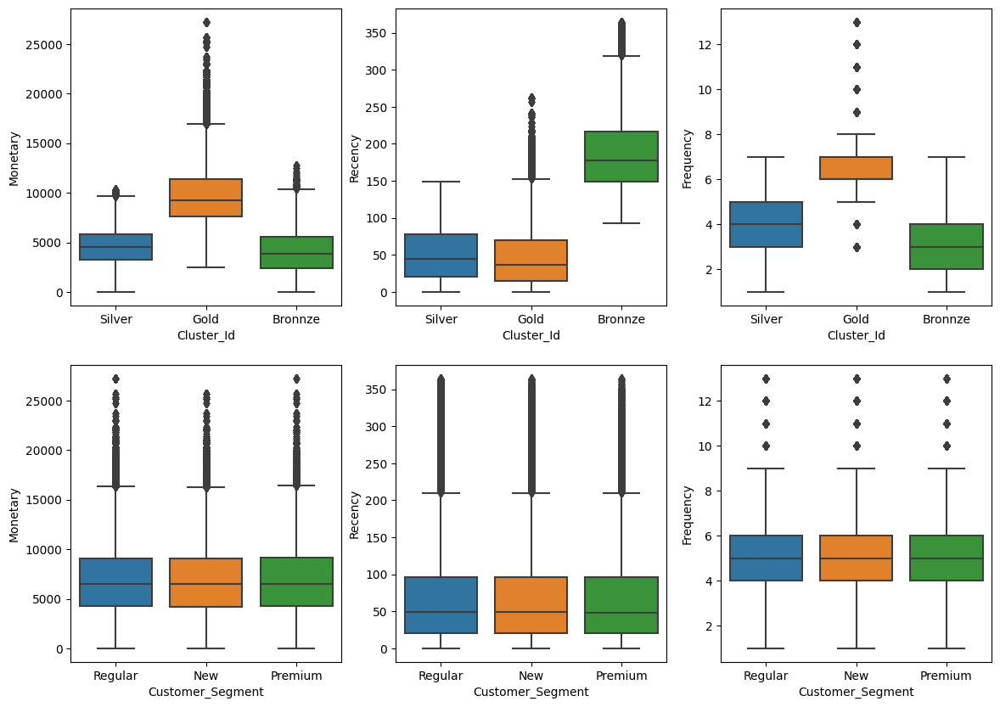

In [49]:
# Box plot to visualize 
f,axes = plt.subplots(2,3,figsize=(14,10))

sns.boxplot(x='Cluster_Id', y='Monetary', data=rfm_final_compare, ax=axes[0,0])
sns.boxplot(x='Cluster_Id', y='Recency', data=rfm_final_compare, ax=axes[0,1])
sns.boxplot(x='Cluster_Id', y='Frequency', data=rfm_final_compare, ax=axes[0,2])
sns.boxplot(x='Customer_Segment', y='Monetary', data=rfm_final_compare, ax=axes[1,0])
sns.boxplot(x='Customer_Segment', y='Recency', data=rfm_final_compare, ax=axes[1,1])
sns.boxplot(x='Customer_Segment', y='Frequency', data=rfm_final_compare, ax=axes[1,2])

# Conclusion

- It is clear from the above visual that the segmentation data given with the dataset is not done based on Monetary, Recency or Frequency aspects.
- With the customer segmentation done by our model, the business can drive more advertising campaigns towards Bronze and Silver customers to promote them to higher tier.
- More offers, discounts or rewards can be provided to Silver and Gold customers for increasing purchases and also for customer retention.
- The business can further analyze the spending pattern of Bronze customers and find ways to increase their engagement.
- From the inferences based on EDA, the mean age of customers seem to be on the lower side. This demographic can be targeted with more rewards or lucrative product offers. In addition to this, the business also needs to take care of all the pending orders which are lowering the overall rating.